<a href="https://colab.research.google.com/github/Abhi-nav0506/GreedyGame-Assignment/blob/main/GreedyGame_Assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#Import package
import pandas as pd
import numpy as np
from google.colab import drive
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns


drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
gg_ad_df = pd.read_csv('/content/drive/MyDrive/sample_data_set_2 - Sheet1 (1).csv')
gg_ad_df.head(5)

,Date,App,Ad Group,State,Revenue,Ad Requests,Ad Responses,Fill Rate,Impressions,Render Rate,1st Clicks,2nd Clicks
0,08 Sep 2020,(SDK X) Cricket Mazza,Cricket Mazza Banner (AdX),Unresolved,0.0,3932330,3926253,99.9%,3849749,98.1%,10199,0
1,08 Sep 2020,(SDK X) Cricket Mazza,320x50,Unresolved,0.0,3932330,119,99.9%,118,99.2%,2,2
2,08 Sep 2020,(SDK X) Cricket Mazza,Dream11_320x50,Unresolved,0.0,3932330,96,99.9%,93,96.9%,2,2
3,08 Sep 2020,(SDK X) Cricket Mazza,My11_320x50,Unresolved,0.0,3932330,111,99.9%,110,99.1%,2,2
4,06 Sep 2020,(SDK X) Cricket Mazza,Cricket Mazza Banner (AdX),Unresolved,0.0,3839002,3834328,99.9%,3785127,98.7%,9492,0


In [ ]:
gg_ad_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48293 entries, 0 to 48292
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          48293 non-null  object 
 1   App           48270 non-null  object 
 2   Ad Group      44300 non-null  object 
 3   State         48293 non-null  object 
 4   Revenue       48293 non-null  float64
 5   Ad Requests   48293 non-null  int64  
 6   Ad Responses  48293 non-null  int64  
 7   Fill Rate     48293 non-null  object 
 8   Impressions   48293 non-null  int64  
 9   Render Rate   48293 non-null  object 
 10  1st Clicks    48293 non-null  int64  
 11  2nd Clicks    48293 non-null  int64  
dtypes: float64(1), int64(5), object(6)
memory usage: 4.4+ MB


In [ ]:
gg_ad_df[gg_ad_df['App'].isna()]

,Date,App,Ad Group,State,Revenue,Ad Requests,Ad Responses,Fill Rate,Impressions,Render Rate,1st Clicks,2nd Clicks
48233,07 Sep 2020,NaN,Dream11,Maharashtra,0.0,0,0,0.00%,0,0.00%,0,0
48243,06 Sep 2020,NaN,Rooter_Cricket,Maharashtra,0.0,0,0,0.00%,0,0.00%,0,0
48244,06 Sep 2020,NaN,RC_MH_Stock_Marathi,Maharashtra,0.0,0,0,0.00%,0,0.00%,0,0
48245,06 Sep 2020,NaN,logo with name,Maharashtra,0.0,0,0,0.00%,0,0.00%,0,0
48250,09 Sep 2020,NaN,Dream11,Maharashtra,0.0,0,0,0.00%,0,0.00%,0,0
48251,09 Sep 2020,NaN,logo with name,Maharashtra,0.0,0,0,0.00%,0,0.00%,0,0
48252,09 Sep 2020,NaN,revshare,Unresolved,0.0,0,0,0.00%,0,0.00%,0,0
48253,09 Sep 2020,NaN,Dhani Backfill,Unresolved,0.0,0,0,0.00%,0,0.00%,0,0
48266,08 Sep 2020,NaN,MY11Circle_IN_SG_1500,Maharashtra,0.0,0,0,0.00%,0,0.00%,0,0
48267,08 Sep 2020,NaN,IPL banner,Maharashtra,0.0,0,0,0.00%,0,0.00%,0,0


* ### Values where column 'App' is NaN, there isn't any sort of numerical data recorded. This seems to be some erroneous data.

In [ ]:
gg_ad_df[gg_ad_df['Ad Group'].isna()]

,Date,App,Ad Group,State,Revenue,Ad Requests,Ad Responses,Fill Rate,Impressions,Render Rate,1st Clicks,2nd Clicks
10131,12 Sep 2020,Vehicle Owner Details,NaN,Maharashtra,0.0,11174,0,0.00%,0,0.00%,0,0
11339,11 Sep 2020,Chhota Bheem Race Game,NaN,Unresolved,0.0,7527,0,0.00%,0,0.00%,0,0
11511,09 Sep 2020,Chhota Bheem Race Game,NaN,Unresolved,0.0,7269,0,0.00%,0,0.00%,0,0
11547,10 Sep 2020,Chhota Bheem Race Game,NaN,Unresolved,0.0,7193,0,0.00%,0,0.00%,0,0
11571,08 Sep 2020,Chhota Bheem Race Game,NaN,Unresolved,0.0,7173,0,0.00%,0,0.00%,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
48228,10 Sep 2020,Barcod Scanner,NaN,Telangana,0.0,0,0,0.00%,0,0.00%,0,0
48229,10 Sep 2020,Vehicle Owner Details,NaN,Goa,0.0,0,0,0.00%,0,0.00%,0,0
48230,10 Sep 2020,VR Thrills,NaN,West Bengal,0.0,0,0,0.00%,0,0.00%,0,0
48231,10 Sep 2020,Zoo Craft : Blocky World Construction & Builder,NaN,Maharashtra,0.0,0,0,0.00%,0,0.00%,0,0


* ### There are some records which have Ad Groups as NULL, but ads have been requested against them. This seems to be some erroneous data.

In [3]:
gg_ad_df['Fill Rate'] = gg_ad_df['Fill Rate'].str.rstrip("%").astype(float)
gg_ad_df['Render Rate'] = gg_ad_df['Render Rate'].str.rstrip("%").astype(float)

In [20]:
gg_ad_grouped = gg_ad_df.groupby(['App','State','Date']).agg({'Ad Requests':'mean','Ad Responses':'sum','Fill Rate':'mean'}).reset_index()
gg_ad_grouped['Fill Rate Calculated'] = round((gg_ad_grouped['Ad Responses'] / gg_ad_grouped['Ad Requests']) * 100,2)
gg_ad_grouped['Fill Rate Difference'] = gg_ad_grouped['Fill Rate'] - gg_ad_grouped['Fill Rate Calculated']

In [21]:
gg_ad_grouped

,App,State,Date,Ad Requests,Ad Responses,Fill Rate,Fill Rate Calculated,Fill Rate Difference
0,(SDK X) Cricket Mazza,12096464,06 Sep 2020,85.0,85,100.00,100.00,0.000000e+00
1,(SDK X) Cricket Mazza,12096464,07 Sep 2020,10.0,10,100.00,100.00,0.000000e+00
2,(SDK X) Cricket Mazza,12096464,08 Sep 2020,884.0,884,100.00,100.00,0.000000e+00
3,(SDK X) Cricket Mazza,12096464,09 Sep 2020,4.0,4,100.00,100.00,0.000000e+00
4,(SDK X) Cricket Mazza,12096464,10 Sep 2020,117.0,118,101.00,100.85,1.500000e-01
5,(SDK X) Cricket Mazza,12096464,11 Sep 2020,286.0,271,94.80,94.76,4.000000e-02
6,(SDK X) Cricket Mazza,12096464,12 Sep 2020,13.0,13,100.00,100.00,0.000000e+00
7,(SDK X) Cricket Mazza,Andaman and Nicobar,06 Sep 2020,64.0,64,100.00,100.00,0.000000e+00
8,(SDK X) Cricket Mazza,Andaman and Nicobar,08 Sep 2020,1.0,1,100.00,100.00,0.000000e+00
9,(SDK X) Cricket Mazza,Andaman and Nicobar,09 Sep 2020,3.0,3,100.00,100.00,0.000000e+00


In [ ]:
gg_ad_grouped.describe()

,Ad Requests,Ad Responses,Fill Rate,Fill Rate Calculated,Fill Rate Difference
count,1.679800e+04,1.679800e+04,16798.000000,16756.000000,16756.000000
mean,1.419266e+04,1.414843e+04,75.414143,76.579178,-0.976004
std,1.387248e+05,1.385268e+05,42.657743,44.176169,9.753274
min,0.000000e+00,0.000000e+00,0.000000,0.000000,-100.000000
25%,6.000000e+00,1.000000e+00,84.025000,88.732500,0.000000
50%,4.200000e+01,2.100000e+01,100.000000,100.000000,0.000000
75%,4.887500e+02,3.490000e+02,100.000000,100.000000,0.000000
max,3.932330e+06,3.926579e+06,150.000000,200.000000,50.000000


* ### The fill rate is defined as %age of Ad Responses on Ad Requests, but in the raw data we are seeing data like 99.9% for 119 Ad Responses over 3932330 Ad Requests, which doesn't make sense.

* ### On grouping the data by [App, State, Date], summing Ad Responses, taking mean of Ad Requests (because same & repetitive),taking mean of originally mentioned fill rate and then calculating fill rate, the new calculated fill rate and originally mentioned fill rate is same for most cases.

* ### But there are cases when the difference b/w calculated and original fill rate is higher. This might be due to some wrong calculations and needs to be corrected as per 'Fill Rate Calculated'. 



In [22]:
gg_ad_grouped[gg_ad_grouped['Fill Rate Difference']<-2]

,App,State,Date,Ad Requests,Ad Responses,Fill Rate,Fill Rate Calculated,Fill Rate Difference
277,4 Digit Code,Chandigarh,11 Sep 2020,41.0,41,97.6,100.00,-2.40
1155,Bangla Panjika (বাংলা পঞ্জিকা) 2020 Calendar-1427,Meghalaya,10 Sep 2020,30.0,31,96.7,103.33,-6.63
2280,Brain Games,Tamil Nadu,10 Sep 2020,32.0,33,100.0,103.12,-3.12
4246,EPF Balance Check PF Balance & Passbook,Kerala,10 Sep 2020,2.0,3,100.0,150.00,-50.00
5708,Guru Cric,Unresolved,10 Sep 2020,19.0,19,94.7,100.00,-5.30
8362,Math Door,Manipur,10 Sep 2020,8.0,9,100.0,112.50,-12.50
8432,Math Door,Uttarakhand,10 Sep 2020,34.0,34,97.1,100.00,-2.90
10165,Mr. Detective,Andaman and Nicobar,11 Sep 2020,15.0,16,100.0,106.67,-6.67
10859,Nursing Exam,Jharkhand,07 Sep 2020,77.0,79,100.0,102.60,-2.60
11020,Odia (Oriya) Calendar,Chandigarh,07 Sep 2020,14.0,12,78.6,85.71,-7.11


In [6]:
gg_ad_grouped1 = gg_ad_grouped[['Date','App','State','Fill Rate Calculated']]

In [7]:
gg_ad_grouped1

,Date,App,State,Fill Rate Calculated
0,06 Sep 2020,(SDK X) Cricket Mazza,12096464,100.00
1,07 Sep 2020,(SDK X) Cricket Mazza,12096464,100.00
2,08 Sep 2020,(SDK X) Cricket Mazza,12096464,100.00
3,09 Sep 2020,(SDK X) Cricket Mazza,12096464,100.00
4,10 Sep 2020,(SDK X) Cricket Mazza,12096464,100.85
...,...,...,...,...
16793,09 Sep 2020,Zoo Craft : Blocky World Construction & Builder,Unresolved,100.00
16794,10 Sep 2020,Zoo Craft : Blocky World Construction & Builder,Unresolved,99.64
16795,11 Sep 2020,Zoo Craft : Blocky World Construction & Builder,Unresolved,100.00
16796,12 Sep 2020,Zoo Craft : Blocky World Construction & Builder,Unresolved,100.00


In [8]:
# merging to add calculated fill rate, which is correct.

gg_ad_df = gg_ad_df.merge(gg_ad_grouped, how = 'inner', left_on=['Date','App','State'], right_on=['Date','App','State'])

gg_ad_df['Fill Rate Calculated'] = gg_ad_df['Fill Rate Calculated'].fillna(0)

In [9]:
gg_ad_df

,Date,App,Ad Group,State,Revenue,Ad Requests,Ad Responses,Fill Rate,Impressions,Render Rate,1st Clicks,2nd Clicks,Fill Rate Calculated
0,08 Sep 2020,(SDK X) Cricket Mazza,Cricket Mazza Banner (AdX),Unresolved,0.0,3932330,3926253,99.9,3849749,98.1,10199,0,99.85
1,08 Sep 2020,(SDK X) Cricket Mazza,320x50,Unresolved,0.0,3932330,119,99.9,118,99.2,2,2,99.85
2,08 Sep 2020,(SDK X) Cricket Mazza,Dream11_320x50,Unresolved,0.0,3932330,96,99.9,93,96.9,2,2,99.85
3,08 Sep 2020,(SDK X) Cricket Mazza,My11_320x50,Unresolved,0.0,3932330,111,99.9,110,99.1,2,2,99.85
4,06 Sep 2020,(SDK X) Cricket Mazza,Cricket Mazza Banner (AdX),Unresolved,0.0,3839002,3834328,99.9,3785127,98.7,9492,0,99.89
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48265,08 Sep 2020,SDK X Native Sample,SDK X Test Ads,Delhi,0.0,0,0,0.0,0,0.0,0,0,0.00
48266,08 Sep 2020,Shortpedia,SDK X Test Ads,Delhi,0.0,0,0,0.0,0,0.0,0,0,0.00
48267,08 Sep 2020,QA SDK X Sample Build,SDK X Test Ads 2,Kerala,0.0,0,0,0.0,0,0.0,0,0,0.00
48268,08 Sep 2020,QA SDK X Sample Build,SDK X Test Ads 2,Karnataka,0.0,0,0,0.0,0,0.0,0,0,0.00


In [ ]:
gg_ad_df.Date.unique()

array(['08 Sep 2020', '06 Sep 2020', '12 Sep 2020', '11 Sep 2020',
       '10 Sep 2020', '09 Sep 2020', '07 Sep 2020'], dtype=object)

In [11]:
gg_ad_grouped2 = gg_ad_df.groupby(['Date','App','State']).agg({'Revenue':'sum','Ad Requests':'mean','Ad Responses':'sum','Fill Rate Calculated':'mean','Impressions':'sum','Render Rate':'mean','1st Clicks':'sum','2nd Clicks':'sum'}).reset_index()
gg_ad_grouped2

,Date,App,State,Revenue,Ad Requests,Ad Responses,Fill Rate Calculated,Impressions,Render Rate,1st Clicks,2nd Clicks
0,06 Sep 2020,(SDK X) Cricket Mazza,12096464,0.00,85.0,85,100.00,82,80.900,0,0
1,06 Sep 2020,(SDK X) Cricket Mazza,Andaman and Nicobar,0.00,64.0,64,100.00,64,100.000,0,0
2,06 Sep 2020,(SDK X) Cricket Mazza,Andhra Pradesh,0.08,362194.0,362019,99.95,357979,99.350,935,151
3,06 Sep 2020,(SDK X) Cricket Mazza,Arunachal Pradesh,0.00,1045.0,1045,100.00,1031,96.550,4,1
4,06 Sep 2020,(SDK X) Cricket Mazza,Assam,0.02,74269.0,74262,99.99,73288,98.275,227,33
...,...,...,...,...,...,...,...,...,...,...,...
16793,12 Sep 2020,World of cricket,Unresolved,0.00,123.0,123,100.00,89,72.360,3,3
16794,12 Sep 2020,World of cricket,Uttar Pradesh,0.00,3.0,3,100.00,3,100.000,0,0
16795,12 Sep 2020,World of cricket,West Bengal,0.00,1.0,1,100.00,0,0.000,0,0
16796,12 Sep 2020,Zoo Craft : Blocky World Construction & Builder,Odisha,0.00,2.0,2,100.00,1,50.000,1,0


* ### APP REVENUE over one week, sorted in descending order **:**

In [12]:
pd.set_option('display.max_rows', None)
gg_ad_app_rev = gg_ad_grouped2.groupby(['App']).agg({'Revenue':'sum','Ad Requests':'sum','Ad Responses':'sum','Fill Rate Calculated':'mean','Impressions':'sum','Render Rate':'mean','1st Clicks':'sum','2nd Clicks':'sum'}).sort_values(by='Revenue', ascending=False).reset_index()

gg_ad_app_rev

,App,Revenue,Ad Requests,Ad Responses,Fill Rate Calculated,Impressions,Render Rate,1st Clicks,2nd Clicks
0,Callbreak Multiplayer,869.40,131430709.0,131423691,99.996389,117137950,83.740324,1092797,418077
1,Bottle Shooting Game,753.89,17485318.0,17484947,99.995510,13112978,73.203429,1121532,330501
2,World Cricket Championship 2,643.44,15378820.0,15099068,99.200163,12068458,82.162080,763675,149724
3,Traffic Bangalore: Check Fines,280.33,892342.0,1728060,196.937066,1011597,46.828577,11955,2
4,World Cricket Championship Lt,145.27,1488498.0,1475191,98.927714,1001420,67.431410,170866,29033
5,Indian Rummy Offline,104.28,1566709.0,1566664,100.001555,1517006,91.311922,8218,3591
6,Tarot Cards Reading and Numerology App,98.86,66997.0,66564,98.873129,64062,90.237485,563,0
7,Mindi Offline,87.34,4922609.0,4921994,99.976184,4806351,93.443959,14318,5370
8,Indian Train Simulator 2018,68.51,1316378.0,1316304,99.991362,1271392,94.888230,126615,96064
9,Sticker Maker,61.95,215867.0,214556,99.854899,114572,45.747062,976,10


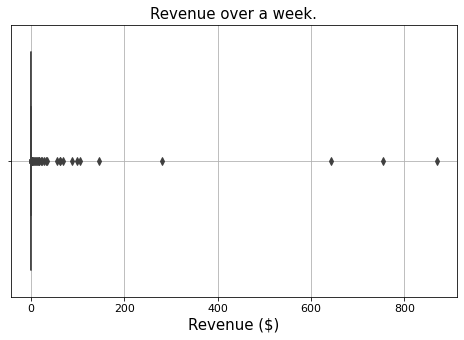

In [53]:
# visualizing Revenue on box plot
plt.figure(figsize=(8,5))
sns.boxplot(x=gg_ad_app_rev['Revenue'])
plt.xlabel('Revenue ($)',fontsize=15)
plt.title('Revenue over a week.',fontsize=15)
plt.grid()

* ### REVENUE wise, the top 3 apps are 'Callbreak Multiplayer', 'Bottle Shooting Game' & 'World Cricket Championship 2' ( 869, 754 & 643 dollars respectively). 

* ### These top 3 apps can be classified as **TIER-1** apps (as the fourth highest is 280 dollars, which is considerably lower than top 3).

* ### These apps are most important, since these apps are generating most revenue for themselves using GreedyGame's platform.

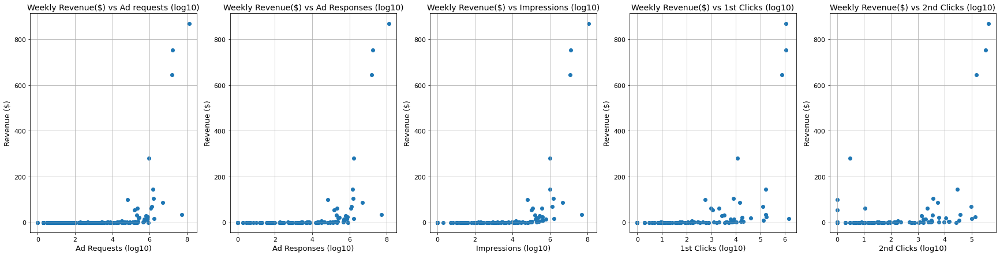

In [52]:
# scatter plot for ad requests, ad responses, impressions, 1st clicks and 2nd clicks vs REVENUE:

fig, ax = plt.subplots(1,5, figsize=(30,7))

ax[0].scatter(np.log10(gg_ad_app_rev['Ad Requests']+1), gg_ad_app_rev['Revenue'])
ax[0].set_xlabel('Ad Requests (log10)',fontsize=13)
ax[0].set_ylabel('Revenue ($)',fontsize=13)
ax[0].set_title('Weekly Revenue($) vs Ad requests (log10)',fontsize=14)
ax[0].grid()

ax[1].scatter(np.log10(gg_ad_app_rev['Ad Responses']+1), gg_ad_app_rev['Revenue'])
ax[1].set_xlabel('Ad Responses (log10)',fontsize=13)
ax[1].set_ylabel('Revenue ($)',fontsize=13)
ax[1].set_title('Weekly Revenue($) vs Ad Responses (log10)',fontsize=14)
ax[1].grid()

ax[2].scatter(np.log10(gg_ad_app_rev['Impressions']+1), gg_ad_app_rev['Revenue'])
ax[2].set_xlabel('Impressions (log10)',fontsize=13)
ax[2].set_ylabel('Revenue ($)',fontsize=13)
ax[2].set_title('Weekly Revenue($) vs Impressions (log10)',fontsize=14)
ax[2].grid()

ax[3].scatter(np.log10(gg_ad_app_rev['1st Clicks']+1), gg_ad_app_rev['Revenue'])
ax[3].set_xlabel('1st Clicks (log10)',fontsize=13)
ax[3].set_ylabel('Revenue ($)',fontsize=13)
ax[3].set_title('Weekly Revenue($) vs 1st Clicks (log10)',fontsize=14)
ax[3].grid()

ax[4].scatter(np.log10(gg_ad_app_rev['2nd Clicks']+1), gg_ad_app_rev['Revenue'])
ax[4].set_xlabel('2nd Clicks (log10)',fontsize=13)
ax[4].set_ylabel('Revenue ($)',fontsize=13)
ax[4].set_title('Weekly Revenue($) vs 2nd Clicks (log10)',fontsize=14)
ax[4].grid()

* ### From the first (left) scatter plot above, we are seeing Revenue($) vs Ad requests (log10 scale) over a period of one week. From this we see that revenue starts rising up from 5 units of Ad requests on log10 scale, i.e. [10^5 = 100000] or 14286 ads per day.
* ### So for an app to improve their revenue, they need to requesting over 14,000 ads per day. But, the number of requests will only be higher, when the traffic on the app is high.

In [37]:
ad_group_df = gg_ad_df.groupby(['Ad Group']).agg({'2nd Clicks':'sum','Revenue':'sum'}).sort_values(by='Revenue',ascending=False).reset_index().rename(columns={'Revenue':'Total Ad Exprenditure ($)'})
ad_group_df['Expense ($) per 100 2nd Clicks'] = round((ad_group_df['Total Ad Exprenditure ($)'] / ad_group_df['2nd Clicks'])*100,2)
ad_group_df['Expense ($) per 100 2nd Clicks'] = ad_group_df['Expense ($) per 100 2nd Clicks'].fillna(0)
ad_group_df

,Ad Group,2nd Clicks,Total Ad Exprenditure ($),Expense ($) per 100 2nd Clicks
0,Bottle Shooting Game_Admob_ML,35054,350.40,1.00
1,MY11Circle_IN_SG_1500,133980,271.80,0.20
2,Callbreak Multiplayer2_Inmobi_No Floor,26686,264.99,0.99
3,IPL banner,122258,260.04,0.21
4,Dream11_NonCore,120575,236.07,0.20
5,Traffic bangalore_Admob_New Banner,1,211.05,21105.00
6,WCC2_Inmobi_H,9551,164.40,1.72
7,Dream11,92499,149.45,0.16
8,Rooter_Cricket,122793,122.69,0.10
9,Gujrati_GL,26592,105.20,0.40
